#### In this notebook we will cluster Github users with K Means and use PCA & t-SNE models as visualization tools

In [1]:
import pandas as pd
import numpy as np

from pymongo import MongoClient
import os
import dotenv

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline as py

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

import warnings

/home/diego/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# 1.1 Cluster Users

## Mongo connection, extract and normalize

In [2]:
dotenv.load_dotenv()
MGURL = os.getenv("MGURL")
myclient = MongoClient(f"{MGURL}")
db = myclient.github

In [3]:
git = list(db.profiles.find({},{"_id":0, "company":0, "location":0, "email":0, "hireable":0}))

In [4]:
df = pd.json_normalize(git, "repos", ["name","repos_number","followers","created","updated"])

## Clean and prepare dataframe

In [5]:
print(df.shape)
df.head()

(1037132, 10)


,repo_name,forked,stars,language,forks,name,repos_number,followers,created,updated
0,AwesomeNER,False,6,Jupyter Notebook,2,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
1,coding-interview-university,True,2,None,1,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
2,COMP2396-assignments,False,0,Java,0,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
3,Computer-and-Communication-Networks,False,0,Python,1,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z
4,Costa-Rican-Household-Poverty-Level-Prediction,False,0,HTML,4,Tarun Sudhams,23,33,2016-05-27T06:16:14Z,2020-05-05T07:34:00Z


In [6]:
df.created = df.created.str.replace(r"\b(?:(?!\d{4}-\d{2}).*)","")
df.updated = df.updated.str.replace(r"\b(?:(?!\d{4}-\d{2}).*)","")
df.drop(columns={"repo_name", "language"}, inplace=True)

In [7]:
df.isnull().sum()

forked              0
stars               0
forks               0
name            33898
repos_number        0
followers           0
created             0
updated             0
dtype: int64

In [8]:
df["years"] = df.updated.astype(int)-df.created.astype(int)
df.drop(columns={"created","updated"}, axis=1, inplace=True)
df.dropna(how="any", inplace=True)

In [9]:
print(df.shape)
df.isnull().sum()

(1003234, 7)


forked          0
stars           0
forks           0
name            0
repos_number    0
followers       0
years           0
dtype: int64

In [10]:
num = df.groupby(["name", "repos_number", "followers", "years"]).agg({"stars":"sum", "forks":"sum"}).reset_index()

In [11]:
num[num.name=="Tarun Sudhams"]

,name,repos_number,followers,years,stars,forks
33492,Tarun Sudhams,23,33,4,49,38


In [12]:
cat = df.groupby(["name","forked"]).size().unstack(fill_value=0).reset_index().rename(columns={"index":"name",False:"user_repo",True:"forked_repo"})

In [13]:
cat[cat.name=="Tarun Sudhams"]

forked,name,user_repo,forked_repo
32038,Tarun Sudhams,19,4


In [14]:
df = pd.merge(num, cat, on="name")

In [15]:
df[df.name=="Tarun Sudhams"]

,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
33492,Tarun Sudhams,23,33,4,49,38,19,4


In [16]:
df.drop_duplicates(subset={"name"}, inplace=True)

## Descriptive Analysis

In [17]:
print(df.shape)
df.head()

(39730, 8)


,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
0,Aníbal Catheringer,2,1,6,0,0,2,0
1,Cohen,18,2,3,0,2,18,0
2,Enrico Antonello,43,14,7,7,2,28,15
3,Jakub Smadiš,16,1,3,0,0,3,13
4,Marián Černý,16,3,8,22,6,3,13


In [18]:
df.describe()

,repos_number,followers,years,stars,forks,user_repo,forked_repo
count,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000,39730.000000
mean,24.255525,24.255298,6.184797,77.669846,21.080191,12.482884,12.768412
std,106.191221,345.282214,2.895754,1015.294577,296.282536,50.270065,91.373219
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000
50%,12.000000,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000
75%,27.000000,13.000000,8.000000,15.000000,6.000000,15.000000,11.000000
max,14637.000000,57545.000000,12.000000,123102.000000,34154.000000,9349.000000,14433.000000


#### As we see there are high max values compared to the means and medians, so we will show the users that can be considered outliers later below

In [19]:
X = df.drop(columns={"name"})

In [20]:
outliers = df[(X>1000).any(1)]
print(outliers.shape)
outliers.head()

(499, 8)


,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
361,Adam Coddington,185,174,10,1975,434,120,65
421,Adam Mckaig,141,358,12,2029,461,82,59
467,Adam Zapletal,31,72,11,1987,376,10,21
1080,Alberto Paro,122,129,12,1108,401,30,92
1083,Alberto Pettarin,49,72,7,1071,271,29,20


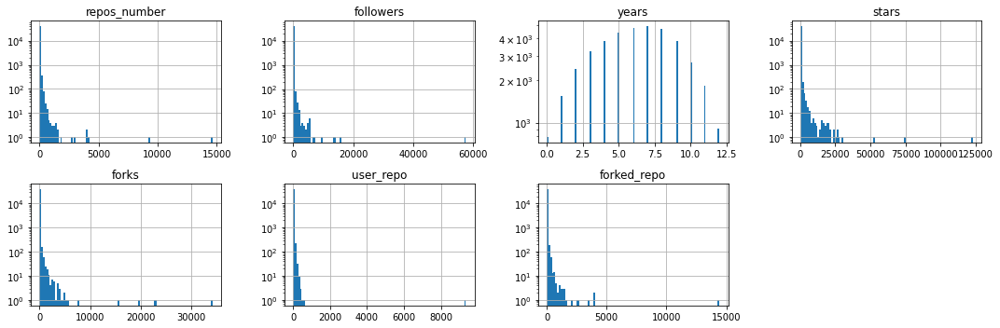

In [21]:
#we can see in all variables except for years and stars that the frequency of 0 es huge
figure = plt.figure(figsize=(15,5))

for n, c in enumerate(X.columns):
  ax = figure.add_subplot(2,4,n+1)
  ax.set_title(c)
  ax.set_yscale("log") #the log scale help us to have a better idea of our data when the distribution is not fair
  X[c].hist(ax=ax, bins=100)

figure.tight_layout() #this feature separate the graphs correctly
plt.show()

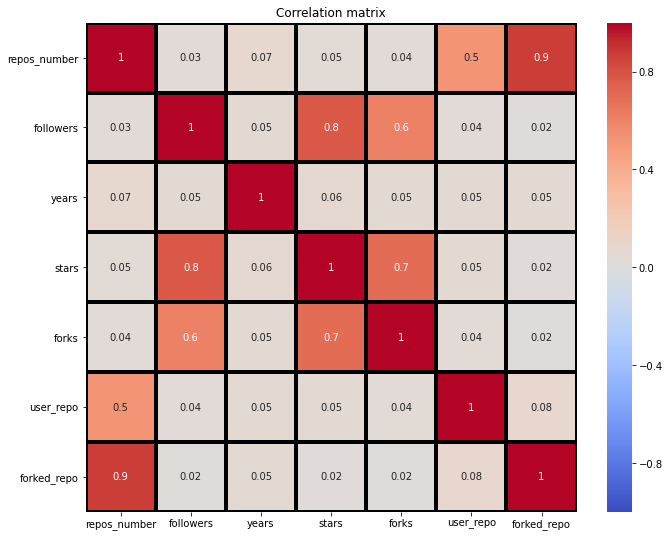

In [22]:
plt.figure(figsize=(11,9))

sns.heatmap(X.corr(), annot = True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm' , linewidths=3, linecolor='black')

plt.title('Correlation matrix')
plt.show()

#### There is a big positive linear relation between followers, stars and forks. However none of the repo columns  neither yeas are related with the 3 previous vars. Therefore we will take these 3 vars as the main characteristics to determine the seniority of users

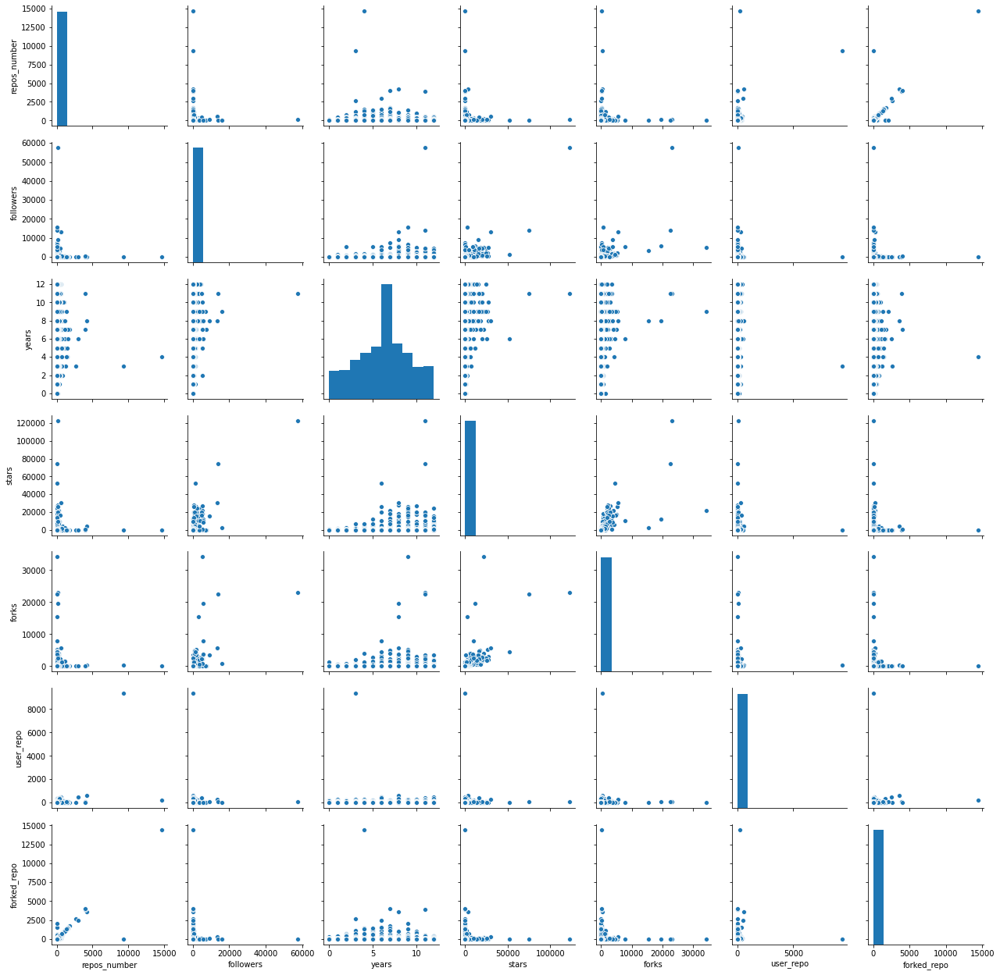

In [23]:
sns.pairplot(X)
plt.show()

#### Above we can see some variables with really huge outliers that could affect our cluster model. Therefore we will eliminate them

In [24]:
df[(X>10000).any(1)]

,name,repos_number,followers,years,stars,forks,user_repo,forked_repo
1822,Alexander Lukyanchikov,22,762,7,17038,4981,6,16
2195,Allen Downey,105,5713,8,12031,19572,78,27
2518,Andrea Cardaci,32,420,8,11256,1029,27,5
2649,Andrea Mazzini,126,1183,9,19122,2196,31,95
3087,Andrew Carl,14637,27,4,48,39,204,14433
3242,Andrey Sitnik,60,4506,12,24147,1974,58,2
3878,Artur Arseniev,45,664,5,12172,2796,33,12
4938,Brad Larson,23,1928,9,26037,5292,17,6
5048,Brendan Gregg,42,4461,8,18460,2712,28,14
5137,Brian Caffo,57,3250,8,2481,15378,37,20


## Pre Cleaning

In [25]:
df.drop(df[(X>10000).any(1)].index, inplace=True)

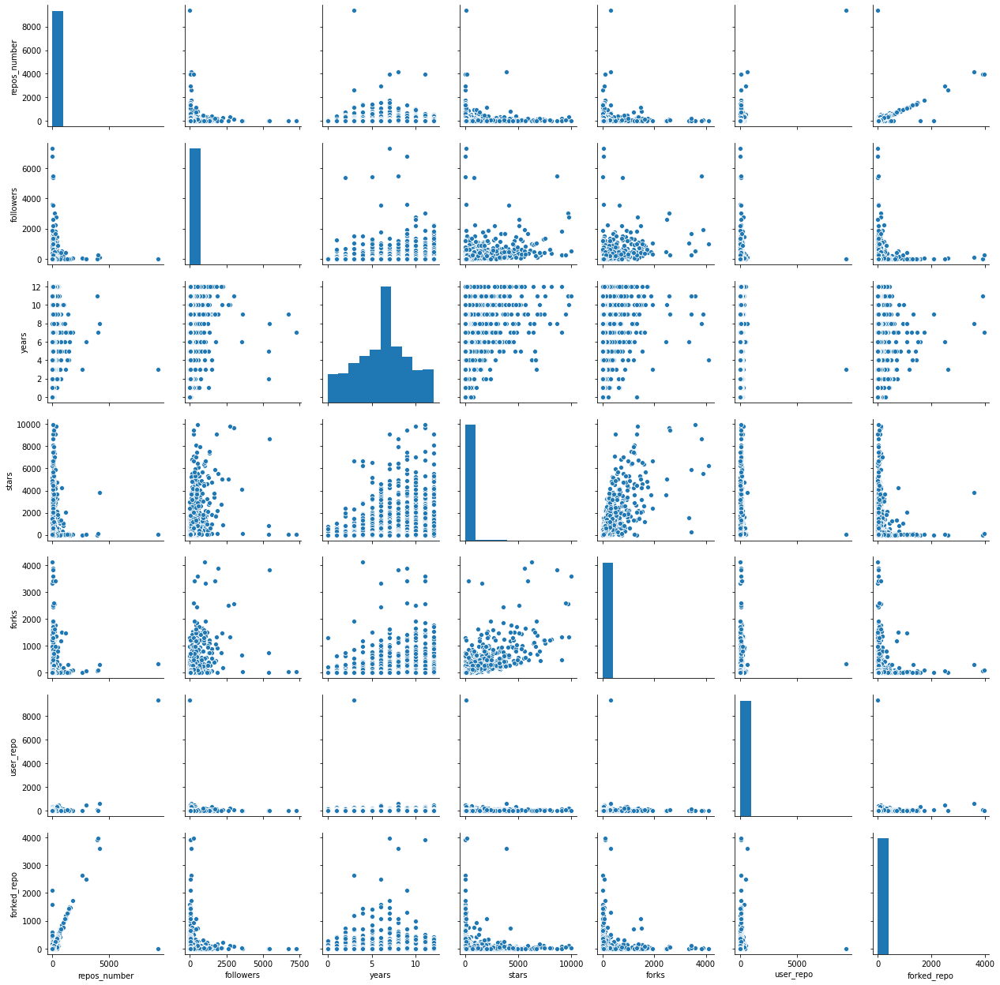

In [26]:
sns.pairplot(df)
plt.show()

#### Now almost all columns look good, but repos_number and followers still have some outliers over 5k, lets eliminate them too

In [27]:
df.drop(df[(X.repos_number>5000)|(X.followers>5000)].index, inplace=True)

/home/diego/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



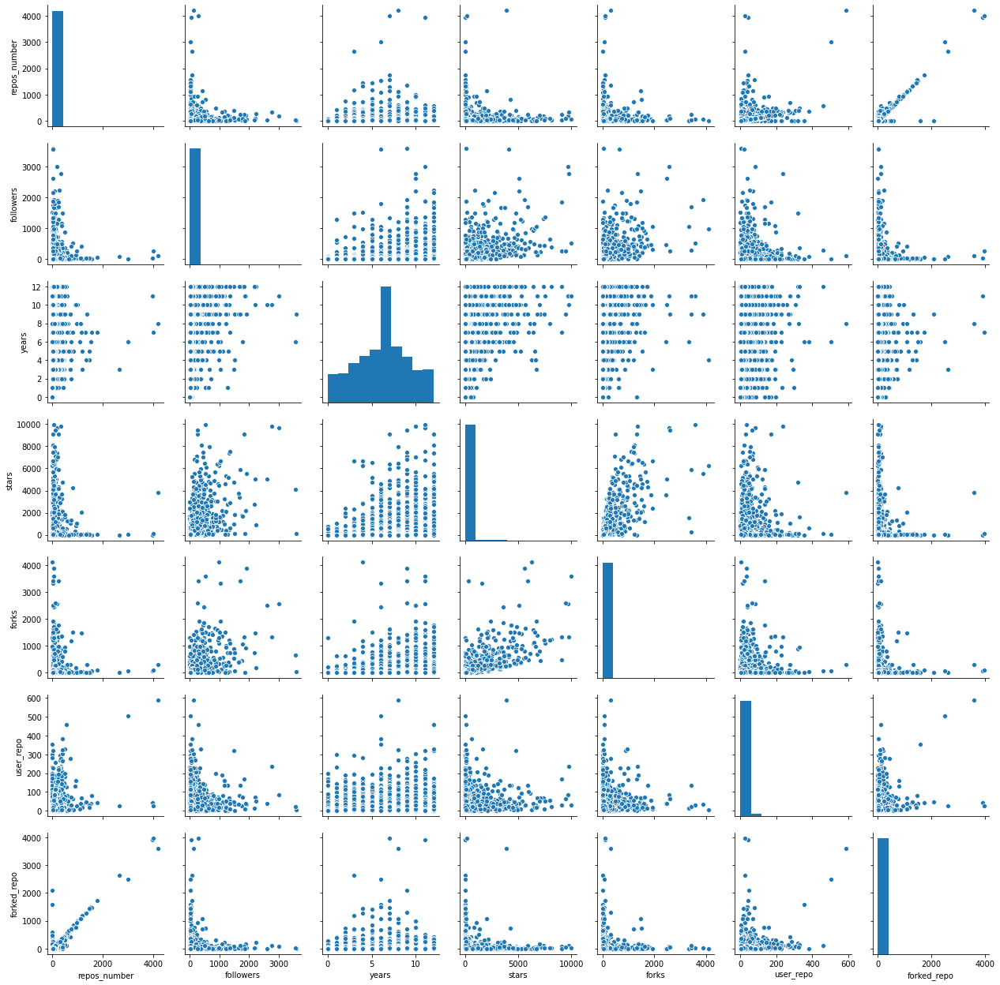

In [28]:
sns.pairplot(df)
plt.show()

In [29]:
df.describe()

,repos_number,followers,years,stars,forks,user_repo,forked_repo
count,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000
mean,23.563432,18.566431,6.181956,53.681905,15.567061,12.189138,12.371321
std,60.793761,75.832125,2.895329,318.009316,86.771050,17.999690,55.802105
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000
50%,12.000000,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000
75%,26.000000,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000
max,4196.000000,3587.000000,12.000000,9979.000000,4111.000000,588.000000,3966.000000


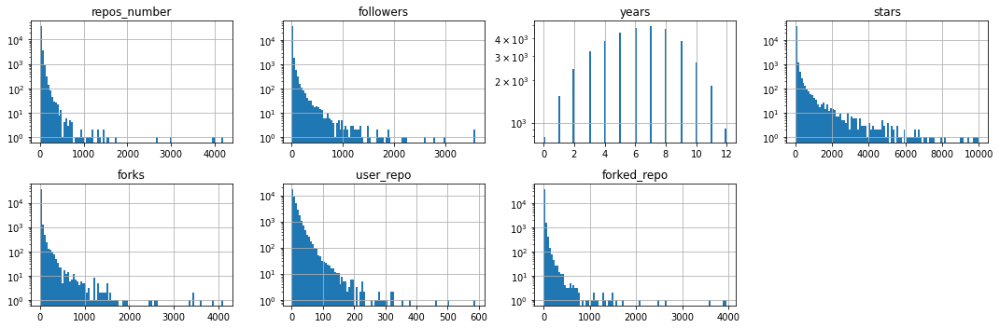

In [30]:
fig = plt.figure(figsize=(15,5))

for n, c in enumerate(df.drop(columns={"name"}).columns):
    ax = fig.add_subplot(2,4,n+1)
    ax.set_title(c)
    ax.set_yscale("log")
    df[c].hist(ax=ax, bins=100)

fig.tight_layout() #this feature separate the graphs correctly
plt.show()

#### Now the distribution of our sample looks fairer so we will proceed with the clustering with K Means

## Applying K Means

#### K Means explained in detail: https://blog.easysol.net/machine-learning-algorithms-3/#:~:text=Machine%20Learning%20Algorithms%20Explained%20%E2%80%93%20K%2DMeans%20Clustering&text=K%2DMeans%20clustering%20is%20an,to%20similarities%20in%20their%20features.

In [31]:
#we will exclude the name and the repos_number as we will use the user_repo and forked_repo for clustering
name = df.name
repos = df.repos_number
X = df.drop(columns={"name","repos_number"})

### Scale

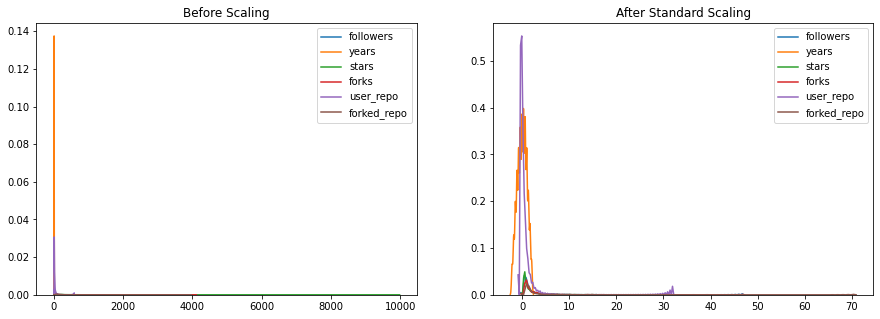

In [32]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

strans = scaler.fit_transform(X)

X_SS = pd.DataFrame(strans)
X_SS.columns = X.columns

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 5))
ax1.set_title('Before Scaling')
for e in X.columns:
    sns.kdeplot(X[e], ax=ax1, legend=True)
ax2.set_title('After Standard Scaling')
for e in X_SS.columns:
    sns.kdeplot(X_SS[e], ax=ax2, legend=True)
plt.show()

#### We show it again

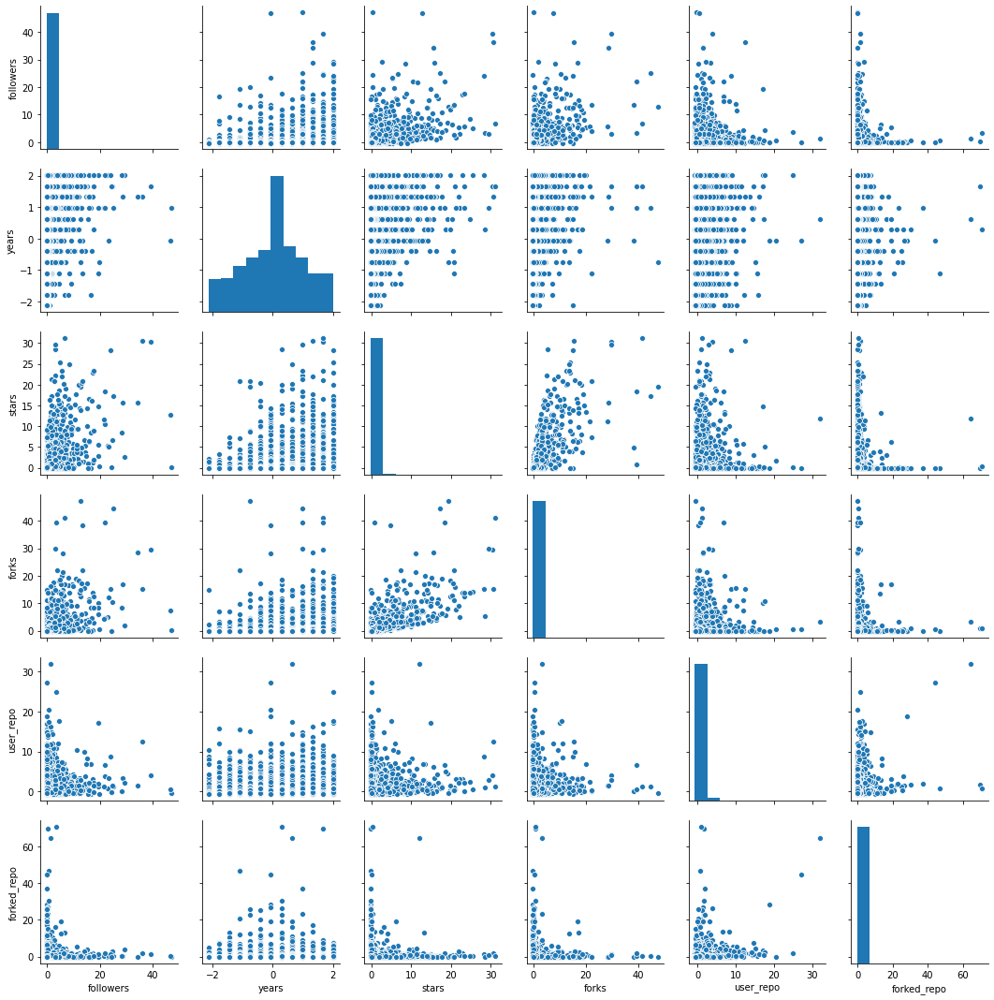

In [33]:
sns.pairplot(X_SS)
plt.show()

#### Now we can see the are just a few outliers, so it is time to apply K Means to identify the clusters of our dataset. We will use the Silhouette Score with the scaled and not scaled data to determine which to use finally and the number of clusters. The reason why we will check with both, scaled and not scaled data is because we have 1 variable, years, which have a different scale than the others, while the rest of variables have similar scale, so the need of scaling is not essential

### Silhouette Score -- Original Data

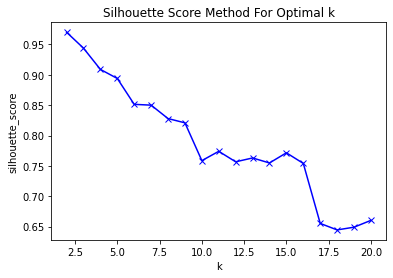

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


In [34]:
#we use the silhouette method to determine the ideal number of clusters. Although our clusters objective is 4-7
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

sil = []
kmax = 20
klusters = range(2, kmax+1)
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in klusters:
    km = KMeans(n_clusters = k).fit(X)
    labels = km.labels_
    sil.append(silhouette_score(X, labels, metric = 'euclidean'))
    
plt.plot(klusters, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Score Method For Optimal k')
plt.show()
%time

### Silhouette Score -- Scaled Data

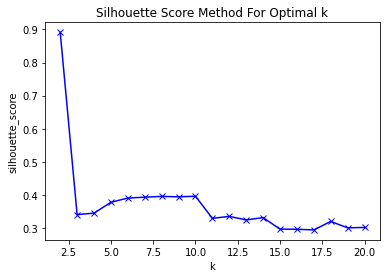

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.01 µs


In [35]:
sil = []
kmax = 20
klusters = range(2, kmax+1)
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in klusters:
    km = KMeans(n_clusters = k).fit(X_SS)
    labels = km.labels_
    sil.append(silhouette_score(X_SS, labels, metric = 'euclidean'))
    
plt.plot(klusters, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Score Method For Optimal k')
plt.show()
%time

- Standard Scaler --> Optimal Clusters 2, then between 7-10 with a score of 0.4
- Original Data --> Optimal Clusters 2, then decreases until 17


#### The optimal number of clusters is 2, but we want between 5-7 so we will use the original data and 5 clusters, as the score given is 0.9

In [36]:
model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [37]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39680, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [38]:
lab = X_kmeans.label.value_counts()
lab

0    38374
2      971
4      225
1       83
3       27
Name: label, dtype: int64

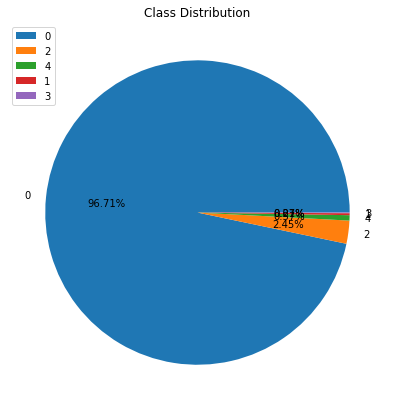

In [39]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

#### As we see the distribution of the labels is not really fair, so we will propabbly have to exclude more outliers again

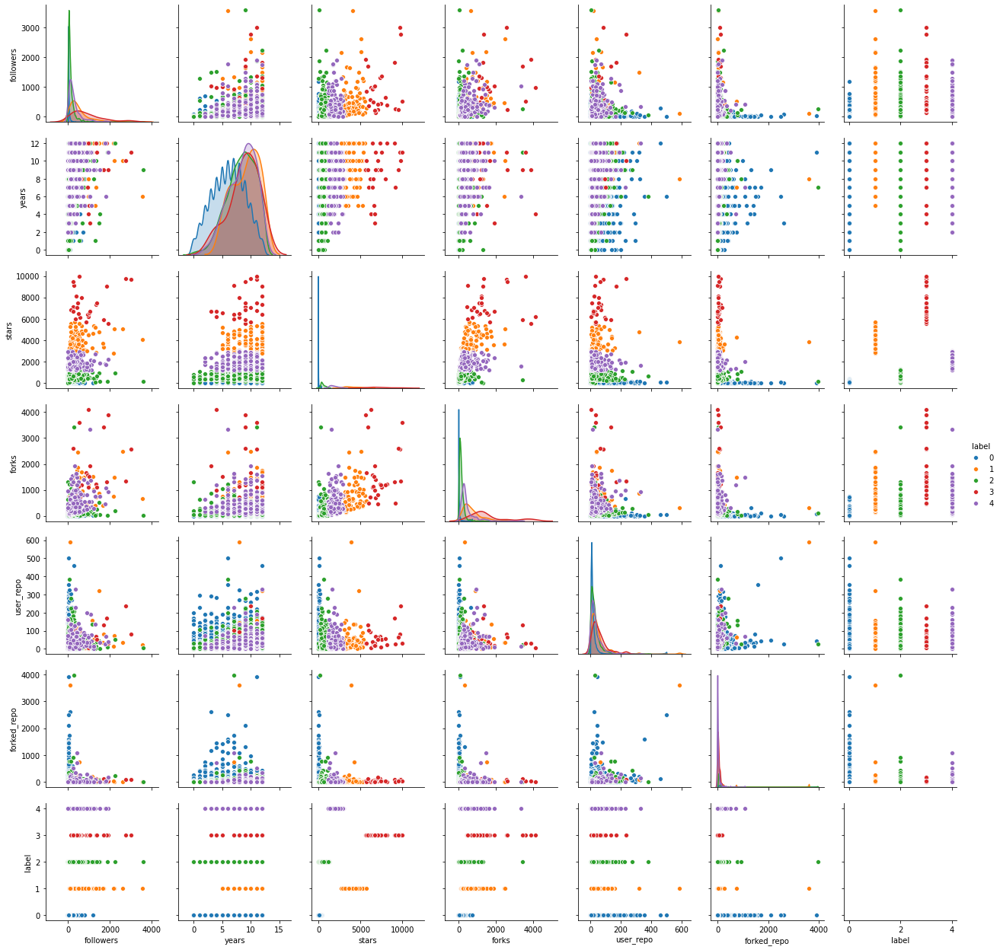

In [40]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

### Conclusions from the graph:
- Labels: the unique variable that is clearly labeled is the stars
- Outliers: we still have outliers that make the label distribution really unfair
    - Forks: from 2.2k there are outliers
    - Followers: same problem 
    - Forked repos: from 2k on there are outliers
    - User repos: from 400

In [41]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000,39680.000000
mean,18.566431,6.181956,53.681905,15.567061,12.189138,12.371321,0.075756
std,75.832125,2.895329,318.009316,86.771050,17.999690,55.802105,0.437139
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,3587.000000,12.000000,9979.000000,4111.000000,588.000000,3966.000000,4.000000


In [42]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                               \
          count        mean         std    min    25%    50%     75%     max   
label                                                                          
0       38374.0   11.890551   26.172226    0.0    3.0    6.0    12.0  1194.0   
1          83.0  574.867470  612.703501   57.0  169.5  393.0   683.0  3560.0   
2         971.0  145.258496  227.308193    0.0   41.0   79.0   163.0  3587.0   
3          27.0  920.185185  762.778778  136.0  375.0  654.0  1180.0  3004.0   
4         225.0  296.991111  323.811329    0.0   93.0  194.0   358.0  1897.0   

         years                                                    stars  \
         count      mean       std  min  25%   50%   75%   max    count   
label                                                                     
0      38374.0  6.105488  2.877565  0.0  4.0   6.0   8.0  12.0  38374.0   
1         83.0  9.120482  2.307980  5.0  7.0  10.0  11.0  12.0     83.0   
2        971.0  8.340886  2.507754  0.0  7.0   9.0  10.0  12.0    971.0   
3         27.0  8.777778  2.562050  3.0  7.5   9.0  11.0  12.0     27.0   
4        225.0  8.511111  2.414819  2.0  7.0   9.0  10.0  12.0    225.0   

                                                                         \
              mean          std     min     25%     50%     75%     max   
label                                                                     
0        16.358811    38.647848     0.0     0.0     2.0    12.0   322.0   
1      3988.433735   784.216421  2746.0  3288.5  3822.0  4680.5  5691.0   
2       575.292482   247.857015     2.0   379.0   509.0   739.5  1270.0   
3      7329.703704  1351.271049  5568.0  6388.0  6817.0  8040.0  9979.0   
4      1843.528889   448.510691  1184.0  1491.0  1746.0  2126.0  2964.0   

         forks                                                           \
         count         mean          std    min     25%     50%     75%   
label                                                                     
0      38374.0     6.744098    19.678598    0.0     0.0     1.0     5.0   
1         83.0   719.012048   491.169498  138.0   368.0   568.0   905.5   
2        971.0   159.471679   166.582743    7.0    77.0   124.0   198.0   
3         27.0  1620.888889  1051.326134  453.0  1046.0  1232.0  1800.5   
4        225.0   447.173333   382.624094   39.0   244.0   327.0   490.0   

              user_repo                                                      \
          max     count       mean        std  min   25%   50%   75%    max   
label                                                                         
0       745.0   38374.0  11.442982  16.236233  0.0   2.0   7.0  14.0  503.0   
1      2496.0      83.0  50.626506  75.804420  3.0  14.0  33.0  53.5  588.0   
2      3422.0     971.0  31.348095  33.994820  1.0  10.0  22.0  39.0  382.0   
3      4111.0      27.0  58.222222  52.460486  4.0  24.5  39.0  68.5  235.0   
4      3330.0     225.0  37.062222  41.149072  1.0  11.0  24.0  47.0  328.0   

      forked_repo                                                        
            count       mean         std  min   25%   50%   75%     max  
label                                                                    
0         38374.0  11.417001   47.750628  0.0   1.0   3.0  10.0  3909.0  
1            83.0  87.915663  401.655544  0.0   9.5  20.0  44.5  3608.0  
2           971.0  36.186406  140.624862  0.0   5.0  16.0  36.0  3966.0  
3            27.0  44.407407   43.138649  0.0  12.0  31.0  61.5   175.0  
4           225.0  40.644444  102.078741  0.0   3.0  11.0  39.0  1078.0

#### If we compare both descriptive tables, we can see that the means, medians and std in the grouped table are still really high and broad respectively. So the best solution is to continue excluding outliers until the distribution and the statistic estimators are fairer. 1st we will start excluding the values said previously

## 1st Clean

In [43]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>2200)|(X_kmeans.followers>2200)|(X_kmeans.forked_repo>2000)|(X_kmeans.user_repo>400)].index, inplace=True)

In [44]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [45]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39659, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [46]:
lab = X_kmeans.label.value_counts()
lab

0    38306
2     1009
3      231
1       84
4       29
Name: label, dtype: int64

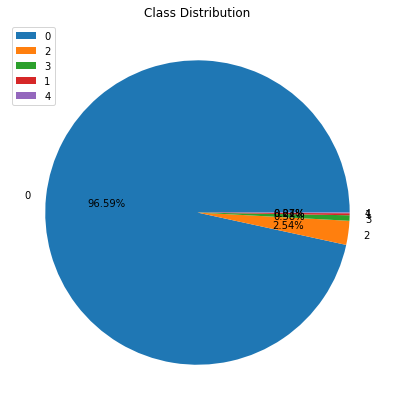

In [47]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

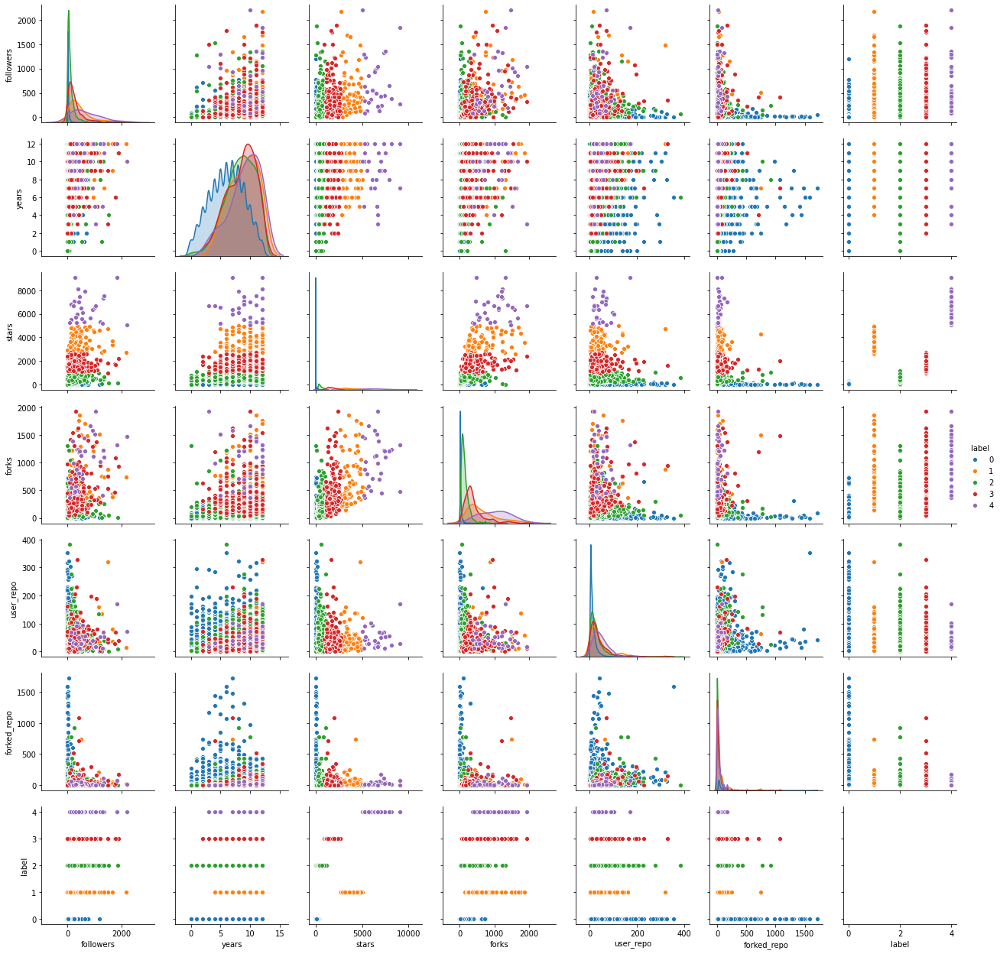

In [48]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [49]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000,39659.000000
mean,17.927885,6.180716,51.785169,14.700598,12.133438,11.887087,0.073401
std,64.622013,2.895014,295.532405,69.661146,17.398639,39.684718,0.403266
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,4.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,2198.000000,12.000000,9101.000000,1934.000000,382.000000,1720.000000,4.000000


In [50]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                               \
          count        mean         std   min     25%    50%     75%     max   
label                                                                          
0       38306.0   11.782749   25.882276   0.0    3.00    6.0    12.0  1194.0   
1          84.0  465.928571  418.872404   0.0  163.75  353.5   614.0  2168.0   
2        1009.0  131.887017  176.754625   0.0   40.00   76.0   152.0  1872.0   
3         231.0  290.095238  321.233952   0.0   83.00  193.0   349.0  1897.0   
4          29.0  704.413793  533.710028  81.0  298.00  527.0  1006.0  2198.0   

         years                                                    stars  \
         count      mean       std  min  25%   50%   75%   max    count   
label                                                                     
0      38306.0  6.101264  2.876359  0.0  4.0   6.0   8.0  12.0  38306.0   
1         84.0  8.928571  2.311760  4.0  7.0   9.0  11.0  12.0     84.0   
2       1009.0  8.350842  2.509467  0.0  7.0   9.0  10.0  12.0   1009.0   
3        231.0  8.506494  2.426072  2.0  7.0   9.0  10.0  12.0    231.0   
4         29.0  9.137931  2.587389  3.0  8.0  10.0  11.0  12.0     29.0   

                                                                          \
              mean          std     min      25%     50%     75%     max   
label                                                                      
0        15.911711    37.070553     0.0     0.00     2.0    12.0   305.0   
1      3640.369048   700.120020  2624.0  3050.75  3437.5  4215.0  5017.0   
2       545.847374   235.505473     2.0   359.00   477.0   694.0  1180.0   
3      1723.675325   404.994550   937.0  1413.50  1662.0  2014.5  2704.0   
4      6534.965517  1114.864581  5063.0  5556.00  6491.0  7102.0  9101.0   

         forks                                                          \
         count         mean         std    min     25%     50%     75%   
label                                                                    
0      38306.0     6.617527   19.378131    0.0    0.00     1.0     5.0   
1         84.0   648.107143  420.063392  138.0  341.75   493.0   847.0   
2       1009.0   148.887017  124.597061    7.0   75.00   118.0   186.0   
3        231.0   411.645022  311.242523   39.0  231.00   321.0   471.0   
4         29.0  1026.275862  424.430534  372.0  694.00  1100.0  1320.0   

              user_repo                                                        \
          max     count       mean        std   min   25%   50%    75%    max   
label                                                                           
0       745.0   38306.0  11.381376  15.804420   0.0   2.0   7.0  14.00  353.0   
1      1864.0      84.0  41.333333  48.250934   2.0  12.0  25.0  50.25  320.0   
2      1307.0    1009.0  31.324083  33.815340   1.0  10.0  22.0  39.00  382.0   
3      1932.0     231.0  37.870130  41.837580   1.0  12.5  24.0  48.00  328.0   
4      1934.0      29.0  48.241379  34.338291  11.0  27.0  41.0  66.00  170.0   

      forked_repo                                                         
            count       mean         std  min    25%   50%   75%     max  
label                                                                     
0         38306.0  11.093615   37.851662  0.0   1.00   3.0  10.0  1720.0  
1            84.0  45.464286   91.617914  0.0   7.75  20.0  48.5   744.0  
2          1009.0  31.884044   61.043598  0.0   5.00  16.0  36.0   921.0  
3           231.0  41.294372  101.024921  0.0   4.00  12.0  42.0  1078.0  
4            29.0  32.724138   37.880354  0.0  10.00  22.0  35.0   175.0

#### We still have a bad distributed sample of labels and the statistic indicators are still high and broad, so we repeat the process again

## 2nd Clean

In [51]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>1300)|(X_kmeans.followers>1000)|(X_kmeans.stars>5000)|(X_kmeans.forked_repo>700)|(X_kmeans.user_repo>250)].index, inplace=True)

In [52]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [53]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39552, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [54]:
lab = X_kmeans.label.value_counts()
lab

0    37159
3     1697
4      456
1      172
2       68
Name: label, dtype: int64

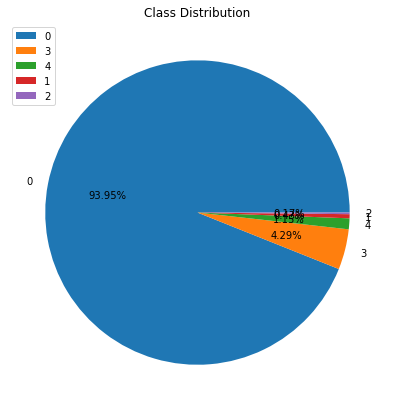

In [55]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

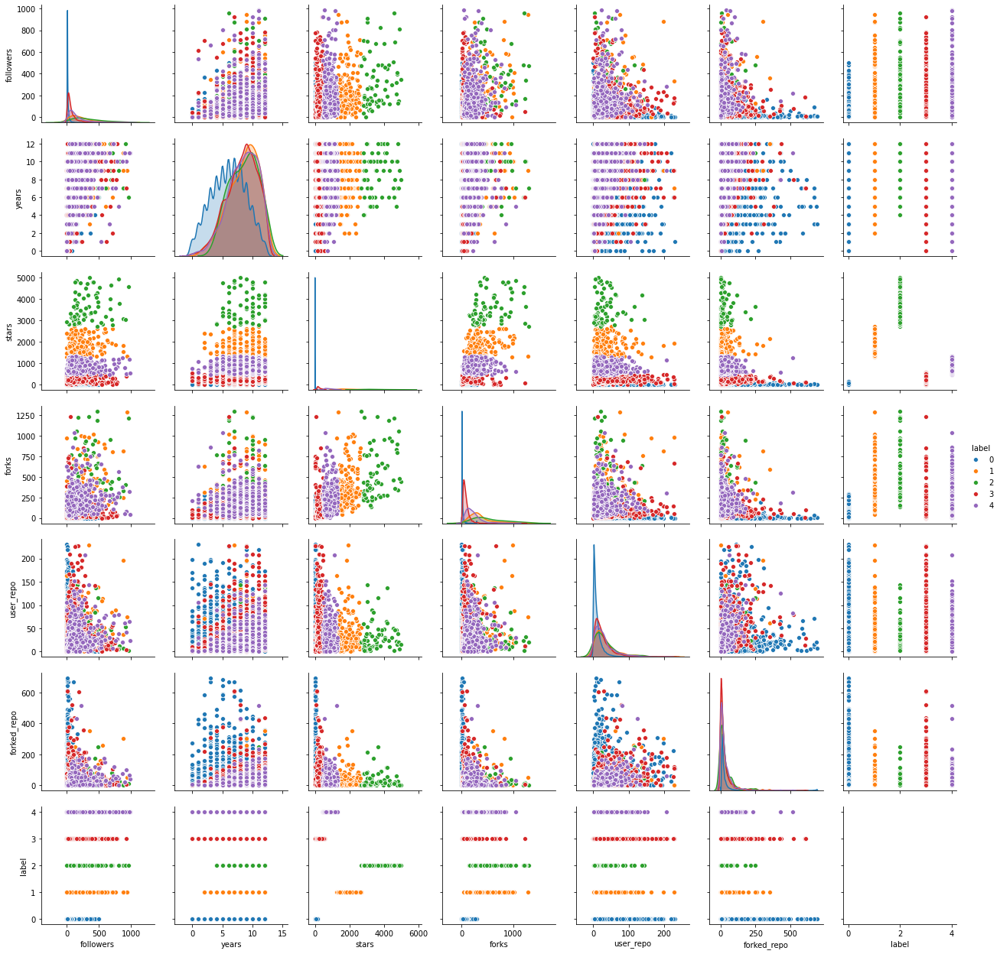

In [56]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [57]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000,39552.000000
mean,16.240367,6.174504,44.514867,12.927741,11.943492,11.158146,0.182620
std,46.122713,2.892333,219.760387,52.102531,16.254742,28.243872,0.740611
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,3.000000,1.000000,7.000000,3.000000,0.000000
75%,13.000000,8.000000,14.000000,6.000000,15.000000,11.000000,0.000000
max,984.000000,12.000000,4999.000000,1300.000000,230.000000,693.000000,4.000000


In [58]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                             \
          count        mean         std  min     25%    50%     75%    max   
label                                                                        
0       37159.0   10.024032   17.317566  0.0    2.00    6.0   11.00  499.0   
1         172.0  226.232558  190.234308  0.0   81.75  176.5  306.25  943.0   
2          68.0  333.720588  236.894198  0.0  152.75  266.5  475.75  959.0   
3        1697.0   78.879199  101.661731  0.0   23.00   45.0   92.00  921.0   
4         456.0  163.142544  169.959632  0.0   54.00  108.0  203.75  984.0   

         years                                                   stars  \
         count      mean       std  min  25%  50%   75%   max    count   
label                                                                    
0      37159.0  6.038914  2.863010  0.0  4.0  6.0   8.0  12.0  37159.0   
1        172.0  8.540698  2.443173  2.0  7.0  9.0  10.0  12.0    172.0   
2         68.0  8.588235  2.293634  4.0  7.0  9.0  10.0  12.0     68.0   
3       1697.0  8.205657  2.524085  0.0  7.0  9.0  10.0  12.0   1697.0   
4        456.0  8.412281  2.473815  0.0  7.0  9.0  10.0  12.0    456.0   

                                                                         \
              mean         std     min      25%     50%     75%     max   
label                                                                     
0        10.821604   21.324007     0.0     0.00     2.0    10.0   150.0   
1      1835.290698  363.631661  1278.0  1524.50  1757.0  2066.5  2704.0   
2      3608.367647  665.516204  2700.0  3050.75  3383.5  4097.0  4999.0   
3       251.663524  112.562569     0.0   164.00   223.0   318.0   560.0   
4       812.324561  211.460115   449.0   633.50   765.0   962.5  1323.0   

         forks                                                                \
         count        mean         std    min     25%    50%     75%     max   
label                                                                          
0      37159.0    4.766113   11.379243    0.0    0.00    1.0    4.00   292.0   
1        172.0  361.720930  223.682845   39.0  217.25  303.0  442.25  1288.0   
2         68.0  541.779412  305.576570  138.0  299.50  434.5  765.00  1300.0   
3       1697.0   82.120801   78.093491    1.0   40.00   63.0  100.00  1228.0   
4        456.0  210.083333  141.677632    8.0  114.00  180.0  267.25  1040.0   

      user_repo                                                       \
          count       mean        std  min   25%   50%    75%    max   
label                                                                  
0       37159.0  10.815307  14.219218  0.0   2.0   6.0  14.00  230.0   
1         172.0  36.395349  36.256164  1.0  14.0  24.5  46.25  229.0   
2          68.0  32.632353  31.298231  2.0  11.0  23.0  47.00  143.0   
3        1697.0  28.375958  29.582254  0.0  10.0  20.0  36.00  228.0   
4         456.0  30.416667  28.497651  1.0  10.0  23.0  39.00  207.0   

      forked_repo                                                      
            count       mean        std  min  25%   50%    75%    max  
label                                                                  
0         37159.0   9.932372  25.793301  0.0  1.0   3.0  10.00  693.0  
1           172.0  30.773256  51.764094  0.0  4.0  12.5  36.25  350.0  
2            68.0  33.588235  48.783480  0.0  3.0  14.5  44.25  249.0  
3          1697.0  30.183265  50.709227  0.0  4.0  14.0  34.00  609.0  
4           456.0  29.500000  45.132674  0.0  4.0  16.0  38.50  516.0

#### Again the distribution and statistic indicators are still too high and broad

## 3rd Clean

In [59]:
X_kmeans.drop(X_kmeans[(X_kmeans.forks>442)|(X_kmeans.followers>475)|(X_kmeans.stars>900)].index, inplace=True)

In [60]:
X = X_kmeans.drop(columns={"label"})

model = KMeans(n_clusters=5)

labels = model.fit_predict(X)

X["label"] = labels

In [61]:
X_kmeans = X
print(X_kmeans.shape)
X_kmeans.head()

(39088, 7)


,followers,years,stars,forks,user_repo,forked_repo,label
0,1,6,0,0,2,0,0
1,2,3,0,2,18,0,0
2,14,7,7,2,28,15,0
3,1,3,0,0,3,13,0
4,3,8,22,6,3,13,0


In [62]:
lab = X_kmeans.label.value_counts()
lab

0    34556
2     3014
3      926
1      382
4      210
Name: label, dtype: int64

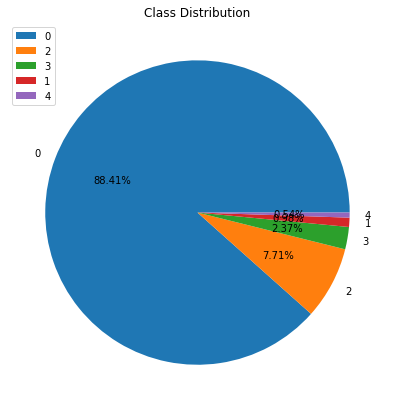

In [63]:
plt.figure(figsize=(15,7))
plt.pie(lab, labels=lab.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

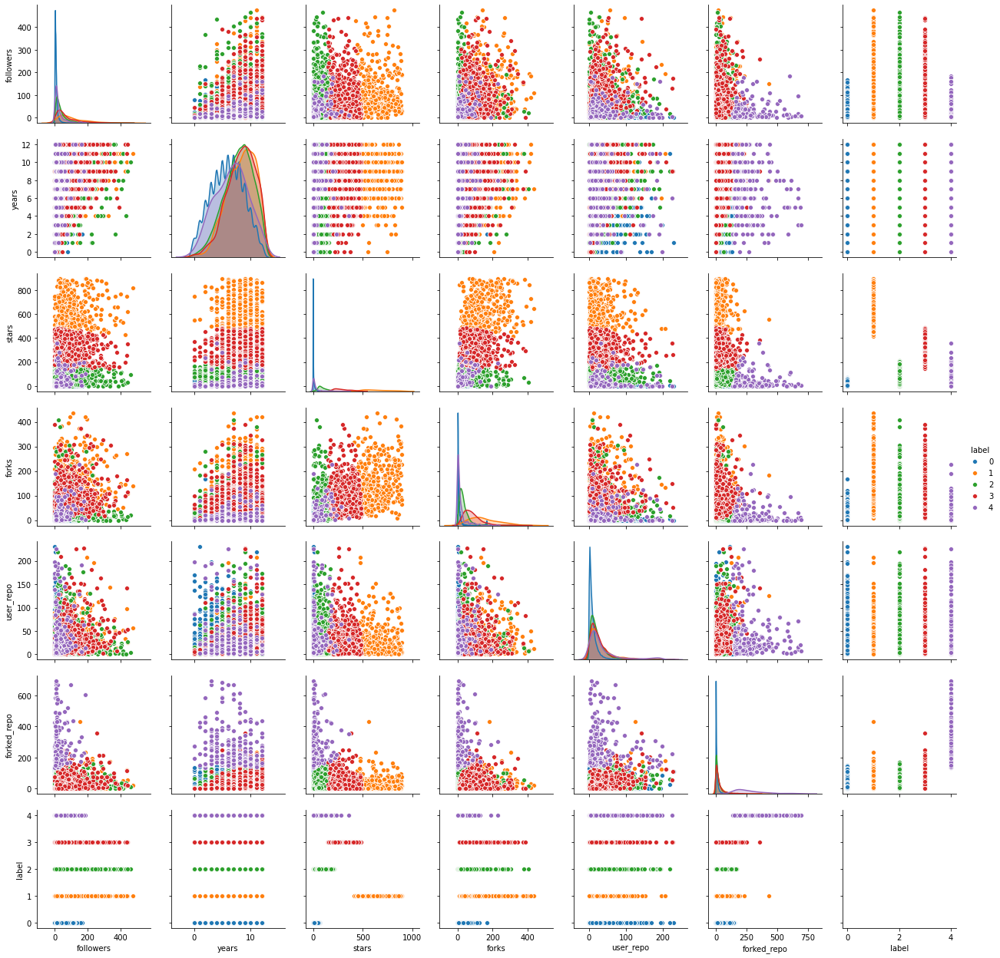

In [64]:
warnings.filterwarnings("ignore")

sns.pairplot(X_kmeans, hue="label")
plt.show()

In [65]:
X_kmeans.describe()

,followers,years,stars,forks,user_repo,forked_repo,label
count,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000,39088.000000
mean,13.280598,6.147513,25.846833,8.980864,11.689649,10.923736,0.256549
std,27.937183,2.886071,80.693837,26.381253,15.783288,27.831596,0.742679
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,0.000000,0.000000,3.000000,1.000000,0.000000
50%,6.000000,6.000000,2.000000,1.000000,7.000000,3.000000,0.000000
75%,12.000000,8.000000,13.000000,6.000000,15.000000,11.000000,0.000000
max,475.000000,12.000000,895.000000,437.000000,230.000000,693.000000,4.000000


In [66]:
#this allows us to see all the columns
pd.set_option('display.max_columns', None)

X_kmeans.groupby("label").describe()

followers                                                          \
          count        mean        std  min    25%   50%     75%    max   
label                                                                     
0       34556.0    7.939663  10.151318  0.0   2.00   5.0   10.00  168.0   
1         382.0  109.034031  92.297712  0.0  42.00  78.5  151.75  475.0   
2        3014.0   43.376244  52.039389  0.0  13.00  27.0   51.00  465.0   
3         926.0   72.164147  72.300776  0.0  23.25  46.0   95.00  442.0   
4         210.0   26.371429  33.934572  0.0   7.00  13.5   31.75  185.0   

         years                                                   stars  \
         count      mean       std  min  25%  50%   75%   max    count   
label                                                                    
0      34556.0  5.914053  2.843442  0.0  4.0  6.0   8.0  12.0  34556.0   
1        382.0  8.329843  2.480602  0.0  7.0  9.0  10.0  12.0    382.0   
2       3014.0  7.852024  2.547394  0.0  6.0  8.0  10.0  12.0   3014.0   
3        926.0  8.292657  2.500528  0.0  7.0  9.0  10.0  12.0    926.0   
4        210.0  6.671429  2.877340  0.0  4.0  7.0   9.0  12.0    210.0   

                                                                     forks  \
             mean         std    min     25%    50%    75%    max    count   
label                                                                        
0        6.219557   10.350966    0.0    0.00    2.0    7.0   67.0  34556.0   
1      634.772251  125.253792  414.0  529.25  610.5  730.0  895.0    382.0   
2       91.666888   42.142653    0.0   61.00   84.0  119.0  208.0   3014.0   
3      291.298056   77.607465  147.0  228.00  277.0  349.0  483.0    926.0   
4       32.709524   55.409190    0.0    3.00   11.0   31.0  355.0    210.0   

                                                              user_repo  \
             mean        std  min   25%    50%     75%    max     count   
label                                                                     
0        2.922213   6.007093  0.0   0.0    1.0    3.00  168.0   34556.0   
1      153.526178  85.254155  8.0  89.0  136.0  208.75  437.0     382.0   
2       36.062707  33.216611  0.0  16.0   28.0   45.75  408.0    3014.0   
3       85.200864  54.939364  8.0  46.0   73.0  108.00  390.0     926.0   
4       18.228571  31.933471  0.0   1.0    6.0   19.00  228.0     210.0   

                                                            forked_repo  \
            mean        std  min    25%   50%    75%    max       count   
label                                                                     
0       9.903779  12.762373  0.0   2.00   6.0  13.00  230.0     34556.0   
1      30.238220  31.003231  1.0   9.25  20.0  39.00  207.0       382.0   
2      23.008295  22.354124  0.0   8.25  16.0  30.00  219.0      3014.0   
3      27.896328  28.765746  0.0  10.00  20.0  35.75  227.0       926.0   
4      37.904762  46.722539  0.0  10.00  19.5  43.75  226.0       210.0   

                                                                   
             mean         std    min    25%    50%     75%    max  
label                                                              
0        7.771675   13.762464    0.0    1.0    3.0    9.00  147.0  
1       28.790576   41.275569    0.0    5.0   16.0   36.00  430.0  
2       20.958859   25.709945    0.0    4.0   12.0   28.00  170.0  
3       27.690065   39.124915    0.0    5.0   14.0   33.75  356.0  
4      279.142857  130.114630  135.0  180.5  233.5  339.00  693.0

#### Now we can say we have a fair distribution and the statistic indicators are closer to the ones of the original dataset, so lets see the characteristics of the labels in a radar chart

## Cleaned & Clustered Data

In [67]:
X_kmeans = X_kmeans.reset_index().drop(columns={"index"})
X_kmeans_grouped = X_kmeans.groupby("label").agg({"followers":"mean", "years":"mean", "stars":"mean", "forks":"mean", "user_repo":"mean", "forked_repo":"mean"}).reset_index()
X_kmeans_grouped

,label,followers,years,stars,forks,user_repo,forked_repo
0,0,7.939663,5.914053,6.219557,2.922213,9.903779,7.771675
1,1,109.034031,8.329843,634.772251,153.526178,30.238220,28.790576
2,2,43.376244,7.852024,91.666888,36.062707,23.008295,20.958859
3,3,72.164147,8.292657,291.298056,85.200864,27.896328,27.690065
4,4,26.371429,6.671429,32.709524,18.228571,37.904762,279.142857


In [68]:
categories = list(X_kmeans_grouped)[1:]

fig = go.Figure()

for v in X_kmeans_grouped.values:
    fig.add_trace(go.Scatterpolar(
    r=v[1:],
    theta=categories,
    fill="toself",
    name=str(v[0]),
    text=str(v[0]),
    opacity=1,
    marker=dict(size=10)
    ))
    
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[0, 800])), showlegend=True)

fig.show()

<img src='../OUTPUT/kmeans_reduction_radar.png'/>

#### Finally we can see the characteristics of our labels and the Github users clustered by the 6 original dimensions. However there is problem, as the data is not scaled, the years cannot be seen compared to the rest of the variables, therefore we are going to solve this problem showing the scaled data

In [69]:
X_kmeans_scaled = X_kmeans.drop(columns={"label"})

strans = scaler.fit_transform(X_kmeans_scaled)

X_kmeans_ss = pd.DataFrame(strans)
X_kmeans_ss.columns = X_kmeans_scaled.columns
X_kmeans_ss["label"] = X_kmeans.label

In [70]:
X_scaled = X_kmeans_ss.groupby("label").agg({"followers":"mean", "years":"mean", "stars":"mean", "forks":"mean", "user_repo":"mean", "forked_repo":"mean"}).reset_index()
X_scaled

,label,followers,years,stars,forks,user_repo,forked_repo
0,0,-0.191179,-0.080893,-0.243235,-0.229660,-0.113151,-0.113256
1,1,3.427499,0.756169,7.546217,5.479162,1.175218,0.641971
2,2,1.077275,0.590607,0.815687,1.026570,0.717138,0.360570
3,3,2.107739,0.743284,3.289652,2.889210,1.026838,0.602428
4,4,0.468587,0.181535,0.085047,0.350545,1.660962,9.637340


In [74]:
categories = list(X_scaled)[1:]

fig = go.Figure()

for v in X_scaled.values:
    fig.add_trace(go.Scatterpolar(
    r=v[1:],
    theta=categories,
    fill="toself",
    name=str(v[0]),
    text=str(v[0]),
    opacity=1,
    marker=dict(size=10)
    ))
    
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[-.3, 10])), showlegend=True)

fig.show()

<img src='../OUTPUT/kmeans_reduction_scaled_radar.png'/>

#### Now as we see years has been taken into account, but on the other side, other variables like stars have lost some importance. So which graph should we use? From my point of view both, the 1st one shows you the real data (however showing a variable like years next to higher scaled ones doesn't have sense as we saw) and this one compares each label by each variable, so is more clear and therefore easily to identify tendencies as;
    - Users with a lot of forked repos tend to have less followers
    - Having more original repos doesn't mean more followers
    - However stars, forks and followers seems to be related
    
#### Thus with this radar chart and using the percentiles of the grouped descriptive table, we can give our classes a name and set their ranges

In [111]:
X_kmeans.groupby("label").describe()

followers                                                          \
          count        mean        std  min    25%   50%     75%    max   
label                                                                     
0       34556.0    7.939663  10.151318  0.0   2.00   5.0   10.00  168.0   
1         382.0  109.034031  92.297712  0.0  42.00  78.5  151.75  475.0   
2        3014.0   43.376244  52.039389  0.0  13.00  27.0   51.00  465.0   
3         926.0   72.164147  72.300776  0.0  23.25  46.0   95.00  442.0   
4         210.0   26.371429  33.934572  0.0   7.00  13.5   31.75  185.0   

         years                                                   stars  \
         count      mean       std  min  25%  50%   75%   max    count   
label                                                                    
0      34556.0  5.914053  2.843442  0.0  4.0  6.0   8.0  12.0  34556.0   
1        382.0  8.329843  2.480602  0.0  7.0  9.0  10.0  12.0    382.0   
2       3014.0  7.852024  2.547394  0.0  6.0  8.0  10.0  12.0   3014.0   
3        926.0  8.292657  2.500528  0.0  7.0  9.0  10.0  12.0    926.0   
4        210.0  6.671429  2.877340  0.0  4.0  7.0   9.0  12.0    210.0   

                                                                     forks  \
             mean         std    min     25%    50%    75%    max    count   
label                                                                        
0        6.219557   10.350966    0.0    0.00    2.0    7.0   67.0  34556.0   
1      634.772251  125.253792  414.0  529.25  610.5  730.0  895.0    382.0   
2       91.666888   42.142653    0.0   61.00   84.0  119.0  208.0   3014.0   
3      291.298056   77.607465  147.0  228.00  277.0  349.0  483.0    926.0   
4       32.709524   55.409190    0.0    3.00   11.0   31.0  355.0    210.0   

                                                              user_repo  \
             mean        std  min   25%    50%     75%    max     count   
label                                                                     
0        2.922213   6.007093  0.0   0.0    1.0    3.00  168.0   34556.0   
1      153.526178  85.254155  8.0  89.0  136.0  208.75  437.0     382.0   
2       36.062707  33.216611  0.0  16.0   28.0   45.75  408.0    3014.0   
3       85.200864  54.939364  8.0  46.0   73.0  108.00  390.0     926.0   
4       18.228571  31.933471  0.0   1.0    6.0   19.00  228.0     210.0   

                                                            forked_repo  \
            mean        std  min    25%   50%    75%    max       count   
label                                                                     
0       9.903779  12.762373  0.0   2.00   6.0  13.00  230.0     34556.0   
1      30.238220  31.003231  1.0   9.25  20.0  39.00  207.0       382.0   
2      23.008295  22.354124  0.0   8.25  16.0  30.00  219.0      3014.0   
3      27.896328  28.765746  0.0  10.00  20.0  35.75  227.0       926.0   
4      37.904762  46.722539  0.0  10.00  19.5  43.75  226.0       210.0   

                                                                   
             mean         std    min    25%    50%     75%    max  
label                                                              
0        7.771675   13.762464    0.0    1.0    3.0    9.00  147.0  
1       28.790576   41.275569    0.0    5.0   16.0   36.00  430.0  
2       20.958859   25.709945    0.0    4.0   12.0   28.00  170.0  
3       27.690065   39.124915    0.0    5.0   14.0   33.75  356.0  
4      279.142857  130.114630  135.0  180.5  233.5  339.00  693.0

In [131]:
#this 1st point is really easy to make with the help of the scaled radar chart
seniority_label = {
    0:"junior",
    2:"middle",
    4:"senior",
    3:"principal",
    1:"architect"
}

#however to set the range of each variable based in the seniority label, we will have to look the percentiles,
#max and mins of each variable in each class
followers_sen = {
    "junior":"0..7",
    "middle":"8..15",
    "senior":"16..50",
    "principal":"51..95",
    "architect":">95"
}

#this column is a bit more complicated, as the classes are not clearly different in this characteristic,
#however by checking the medians, we can see the juniors (class 0) have the lowest and principals & architects
#(classes 3 & 1) have the highest median
years_sen = {
    "junior":"0..4",
    "middle":"1..6",
    "senior":"2..7",
    "principal":">4",
    "architect":">5"
}

stars_sen = {
    "junior":"0..7",
    "middle":"31..84",
    "senior":"8..30",
    "principal":"85..270",
    "architect":">270"
}

forks_sen = {
    "junior":"0..3",
    "middle":"16..45",
    "senior":"4..15",
    "principal":"46..108",
    "architect":">108"
}

user_repo_sen = {
    "junior":"0..8",
    "middle":"9..19",
    "senior":"20..40",
    "principal":">20",
    "architect":">20"
}

forked_repo_sen = {
    "junior":"0..9",
    "middle":"4..28",
    "senior":">50",
    "principal":"5..33",
    "architect":"5..36"
}

df_clustered = X_kmeans
df_clustered["seniority_label"] = df_clustered.label.map(seniority_label)
df_clustered["followers_sen"] = df_clustered.seniority_label.map(followers_sen)
df_clustered["years_sen"] = df_clustered.seniority_label.map(years_sen)
df_clustered["stars_sen"] = df_clustered.seniority_label.map(stars_sen)
df_clustered["forks_sen"] = df_clustered.seniority_label.map(forks_sen)
df_clustered["user_repo_sen"] = df_clustered.seniority_label.map(user_repo_sen)
df_clustered["forked_repo_sen"] = df_clustered.seniority_label.map(forked_repo_sen)

df_clustered.head()

,followers,years,stars,forks,user_repo,forked_repo,label,seniority_label,followers_sen,years_sen,stars_sen,forks_sen,user_repo_sen,forked_repo_sen
0,1,6,0,0,2,0,0,junior,0..7,0..4,0..7,0..3,0..8,0..9
1,2,3,0,2,18,0,0,junior,0..7,0..4,0..7,0..3,0..8,0..9
2,14,7,7,2,28,15,0,junior,0..7,0..4,0..7,0..3,0..8,0..9
3,1,3,0,0,3,13,0,junior,0..7,0..4,0..7,0..3,0..8,0..9
4,3,8,22,6,3,13,0,junior,0..7,0..4,0..7,0..3,0..8,0..9


In [134]:
seniority = df_clustered.seniority_label.value_counts()
seniority

junior       34556
middle        3014
principal      926
architect      382
senior         210
Name: seniority_label, dtype: int64

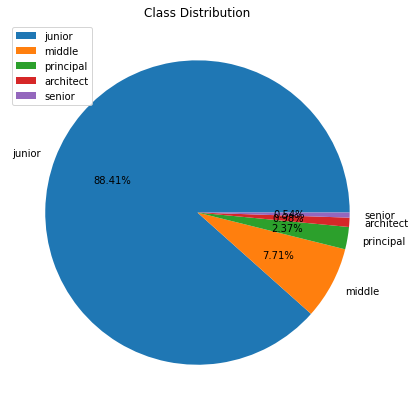

In [135]:
plt.figure(figsize=(15,7))
plt.pie(seniority, labels=seniority.keys(), autopct='%.2f%%')
plt.title("Class Distribution")
plt.legend(loc=2)
plt.show()

## Github Users Clustered

In [144]:
df_clustered = df_clustered.sort_values(by=["stars"])
github_users = df_clustered.iloc[:,7:].drop_duplicates(subset={"seniority_label"}).reset_index(drop=True)
github_users

,seniority_label,followers_sen,years_sen,stars_sen,forks_sen,user_repo_sen,forked_repo_sen
0,junior,0..7,0..4,0..7,0..3,0..8,0..9
1,senior,16..50,2..7,8..30,4..15,20..40,>50
2,middle,8..15,1..6,31..84,16..45,9..19,4..28
3,principal,51..95,>4,85..270,46..108,>20,5..33
4,architect,>95,>5,>270,>108,>20,5..36


#### As a conclusion, you will see that sometimes I have chose the median while other times I have chose the percentiles to set the ranges. Also you will see that in stars and forks, the senior level is lower than the middle level, so in the end you will have to choose between these 2 variables or followers to determine who is over who, senior over middle or the other side around

# 1.2 PCA & t-SNE

## Visualization

#### Now, as we said at the beginning of the notebook we will use the PCA & t-SNE reduction methods to plot the labeled dataset in a 3d dimensions plot

*pd: I'll use the unnamed classes, as we will be referring to the radar charts to interpret the 3d graphs*

### Scale -- Pre PCA

In [75]:
X_to_scale = X_kmeans.drop(columns={"label"})

strans = scaler.fit_transform(X_to_scale)

X_scaled_pca = pd.DataFrame(strans)
X_scaled_pca.columns = X_to_scale.columns

#### Scaling the data before PCA application is obligatory, the main reason is the algorithm will try to put the maximum variance in the 1st component and so on. So if there is a variable with a variance much higher that the rest, this will affect the algorithm and will bias the component analysis focusing most of the attention in that variable

#### Before impletementing the dimensionality reduction lets check the dimensions

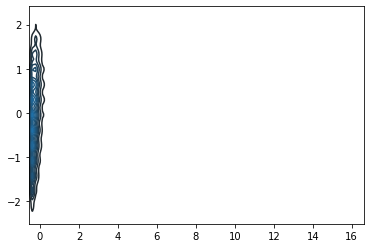

In [79]:
sns.kdeplot(X_scaled_pca)
plt.show()

#### Seems to be more than 3 

In [78]:
X_scaled_pca.shape

(39088, 6)

#### 6 dimensions, actually it is something that we know since the beginning as varaibles = dimensions, but in that way we ensure it is 6

### PCA -- Choosing number of components

#### PCA explained in detail: https://builtin.com/data-science/step-step-explanation-principal-component-analysis

In [80]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X_scaled_pca)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [81]:
pca.explained_variance_ratio_

array([0.43478514, 0.18059568, 0.1480659 , 0.11194439, 0.08866076,
       0.03594813])

Text(0, 0.5, 'Cummulative Explained Variance')

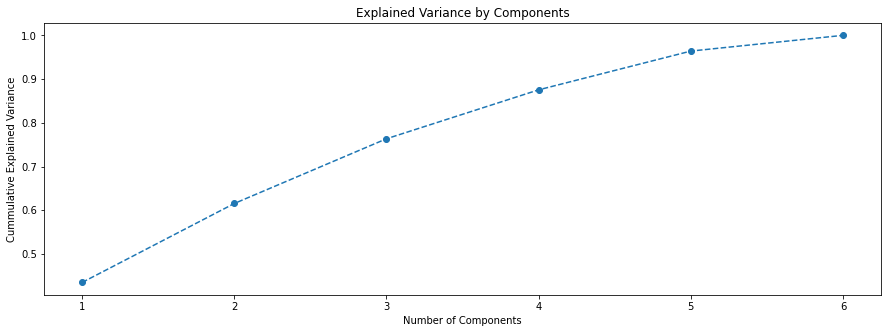

In [82]:
plt.figure(figsize=(15,5)) 
plt.plot(range(1,7), pca.explained_variance_ratio_.cumsum(), marker="o", linestyle="--")
plt.title("Explained Variance by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cummulative Explained Variance")

#### The graph shows the amount of variance captured (on the y-axis) depending on the number of components we include (the x-axis). A rule of thumb is to preserve around 80 % of the variance. So, in this instance, we decide to keep 3 components.

In [83]:
pca = PCA(n_components=3).fit(X_scaled_pca)
pca_3d = pca.transform(X_scaled_pca)

In [84]:
pca_3d.shape

(39088, 3)

In [85]:
pca.components_

array([[ 0.47199012,  0.25024701,  0.51516075,  0.52018003,  0.33172978,
         0.26187641],
       [-0.08550274,  0.25438871, -0.36374205, -0.32960747,  0.47555298,
         0.67887824],
       [-0.02824546, -0.91811374,  0.06980074,  0.09339154,  0.32178733,
         0.19780836]])

In [86]:
pca.explained_variance_ratio_

array([0.43478514, 0.18059568, 0.1480659 ])

In [88]:
X_kmeans_pca = pd.concat([X_kmeans, pd.DataFrame(pca_3d).rename(columns={0:"Component1", 1:"Component2", 2:"Component3"})], axis=1)

X_kmeans_pca.dropna(how="any", inplace=True)
print(X_kmeans_pca.shape)
X_kmeans_pca.head()

(39088, 10)


,followers,years,stars,forks,user_repo,forked_repo,label,Component1,Component2,Component3
0,1,6,0,0,2,0,0,-0.868811,-0.305111,-0.270001
1,2,3,0,2,18,0,0,-0.736320,-0.115506,1.016647
2,14,7,7,2,28,15,0,0.209269,0.835988,0.048570
3,1,3,0,0,3,13,0,-0.985599,-0.222310,0.797153
4,3,8,22,6,3,13,0,-0.259500,0.038157,-0.755213


### 3D Graphs
I ll do it in matplotlib and interactive in plotly as will be able to see the differences from different points of view

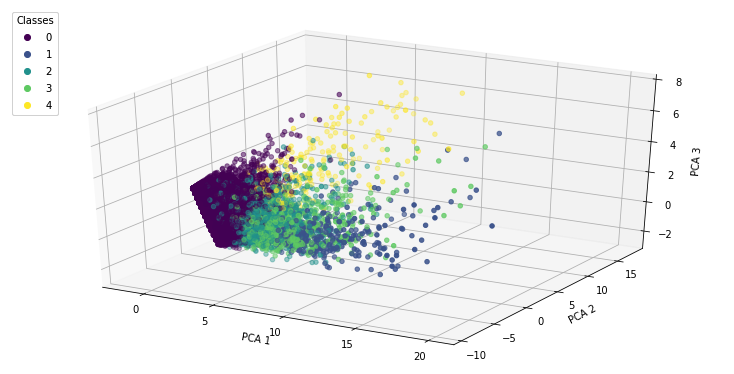

In [89]:
x = X_kmeans_pca.Component1
y = X_kmeans_pca.Component2
z = X_kmeans_pca.Component3

fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

scatter = ax.scatter(x, y, z, c=X_kmeans_pca.label)

legend = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")

ax.add_artist(legend)

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

In [90]:
clust_cpa = X_kmeans_pca.iloc[:,6:]

In [91]:
cont = []
for i in range(5):
    fig = go.Scatter3d(x=clust_cpa.Component1[clust_cpa.label==i],
                        y=clust_cpa.Component2[clust_cpa.label==i],
                        z=clust_cpa.Component3[clust_cpa.label==i],
                        marker=dict(opacity=0.9,
                                    reversescale=True,
                                    colorscale='Blues',
                                    size=5),
                        line=dict (width=0.02),
                        mode='markers')

    cont.append(fig)    
    
#Make Plot.ly Layout
mylayout = go.Layout(scene=dict(xaxis=dict( title="PCA1"),
                                yaxis=dict( title="PCA2"),
                                zaxis=dict(title="PCA3")),)

#Plot and save html

py.iplot({"data": cont,
                     "layout": mylayout},
                     filename=("3DPlot.html"))

<img src='../OUTPUT/kmeans_reduction_pca.png'/>

### t-SNE

#### t-SNE: explained in detail https://mlexplained.com/2018/09/14/paper-dissected-visualizing-data-using-t-sne-explained/

####  Now we will apply the t-SNE method. This method is completely different in the way it makes clusters compared to PCA. If you still have some doubts about it, check this video --> https://www.youtube.com/watch?v=NEaUSP4YerM

In [95]:
X_to_tsne = X_kmeans.drop(columns={"label"})

In [97]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=3, perplexity=50)

X_tsne = tsne.fit_transform(X_to_tsne)

#### As you just have seen the t-SNE method don't require your dataset to be scaled, that is because it preserves the local structure and it does scale the distances between the clusters to cluster the groups correctly even they have different density

In [99]:
X_tsne.shape

(39088, 3)

In [101]:
X_kmeans_tsne = pd.concat([X_kmeans, pd.DataFrame(X_tsne).rename(columns={0:"tsne1", 1:"tsne2", 2:"tsne3"})], axis=1)

X_kmeans_tsne.dropna(how="any")
print(X_kmeans_tsne.shape)
X_kmeans_tsne.head()

(39088, 10)


,followers,years,stars,forks,user_repo,forked_repo,label,tsne1,tsne2,tsne3
0,1,6,0,0,2,0,0,19.659044,-7.169415,-0.505321
1,2,3,0,2,18,0,0,1.840831,2.679637,18.623371
2,14,7,7,2,28,15,0,-7.411173,9.008883,9.167166
3,1,3,0,0,3,13,0,7.104635,15.539403,1.171298
4,3,8,22,6,3,13,0,-4.050569,2.980093,0.688264


### 3D Graphs

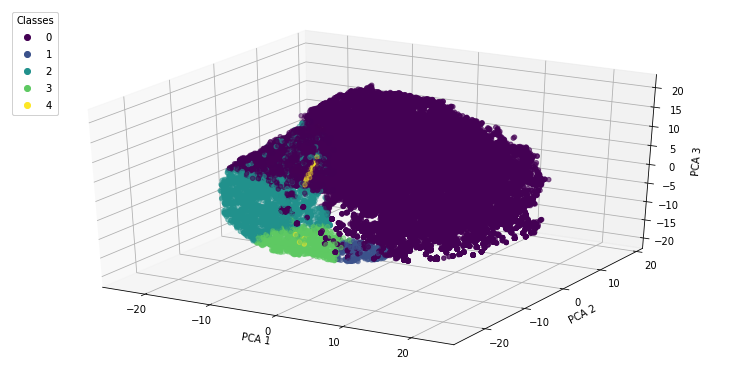

In [110]:
x = X_kmeans_tsne.tsne1
y = X_kmeans_tsne.tsne2
z = X_kmeans_tsne.tsne3

fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

scatter = ax.scatter(x, y, z, c=X_kmeans_tsne.label)

legend = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")

ax.add_artist(legend)

ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

In [103]:
clust_tsne = X_kmeans_tsne.iloc[:,6:]

In [105]:
cont = []
for i in range(5):
    fig = go.Scatter3d(x=clust_tsne.tsne1[clust_tsne.label==i],
                        y=clust_tsne.tsne2[clust_tsne.label==i],
                        z=clust_tsne.tsne3[clust_tsne.label==i],
                        marker=dict(opacity=0.9,
                                    reversescale=True,
                                    colorscale='Blues',
                                    size=5),
                        line=dict (width=0.02),
                        mode='markers')

    cont.append(fig)    
    
#Make Plot.ly Layout
mylayout = go.Layout(scene=dict(xaxis=dict( title="PCA1"),
                                yaxis=dict( title="PCA2"),
                                zaxis=dict(title="PCA3")),)

#Plot and save html

py.iplot({"data": cont,
                     "layout": mylayout},
                     filename=("3DPlot.html"))

<img src='../OUTPUT/kmeans_reduction_tsne.png'/>

### Conclusions from PCA & t-SNE as visualization methods:
    - PCA advantages: thanks to PCA we an corroborate clearly the big differences between some classes. For instance as we saw previously in the scaled radar chart, the classes 1 and 4 are almost opposite and the class 1 is an extension of class 3. These characteristics are clearly apreciated in the interactive PCA graph
    - PCA disadvantages: as we see and as we know from the nature of the PCA algorithm, the distribution of the classes is almost lost in the graph as a 1st instance, as it is linear reduction technique. Just by looking the PCA graph you will never say that the class 0 has the 88% of the distribution of the sample
    
    - t-SNE advantages: on the other side, the big lack of the PCA model is the strong point of the t-SNE model. Due to its computation, the t-SNE is a non linear reduction method which is focused in the stochastic neighbours and keeps the local structure. This allows us to clearly see the distribution of the classes in the sample, maybe we cannot say exactly the percentage, but I'd say the class 0 is between 70% - 80% on the total distribution of the sample
    - t-SNE disadvantages: on the other hand, we cannot say that the t-SNE model has separated bad our classes, but it didn't do it as good as the PCA model did it
    
*pd: The interactive graph is much more recommended for these type of representations*

### Final conclusion:
#### After having implemented dimensionality reduction before and after K Means, we can conclude that if your dataset don't have a big number of dimensions compared to your sample size, or you don't have a lot of correlated variables, it is better to just clean your dataset and use dimensionality reduction as a visualization technique to help you to corroborate differences between classes. However applying a dimensionality reduction technique, if your dataset doesn't have the characteristics mentioned, will make your cluster algorithm useless

#### See the notebook https://github.com/diego-florez/Venandi/blob/master/src/pca_tsne_kmeans_user_repo_clustering.ipynb to check the differences